In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patheffects as PathEffects
from PIL import Image, ImageDraw, ImageOps
%matplotlib inline
import seaborn as sns
import random
import os
import gc

from sklearn.manifold import TSNE
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models, Sequential
from tensorflow.keras import optimizers

from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, SeparableConv2D


from tensorflow.keras.applications import VGG19


from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from keras.preprocessing.image import img_to_array, load_img

from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve


In [37]:
train_dir = r"C:/Users/yalal/Downloads/autisum spectrum/train"
test_dir = r"C:/Users/yalal/Downloads/autisum spectrum/test"

In [41]:
import os
import random
import gc

train_non_autistic = []
train_autistic = []

train_dir = r"C:/Users/yalal/Downloads/autisum spectrum/train"
test_dir = r"C:/Users/yalal/Downloads/autisum spectrum/test"

for i in os.listdir(train_dir):
    file_path = os.path.join(train_dir, i)
    if 'Non_Autistic' in i:
        train_non_autistic.append(file_path)
    else:
        train_autistic.append(file_path)

test_imgs = [os.path.join(test_dir, i) for i in os.listdir(test_dir)]

train_imgs = train_autistic + train_non_autistic
random.shuffle(train_imgs)

del train_autistic
del train_non_autistic
gc.collect()


966

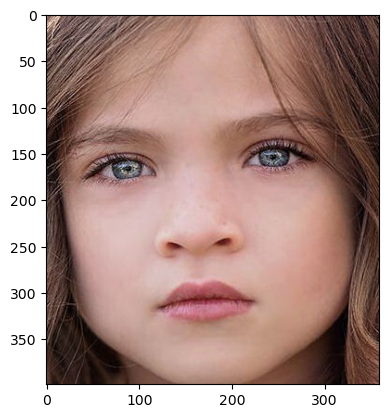

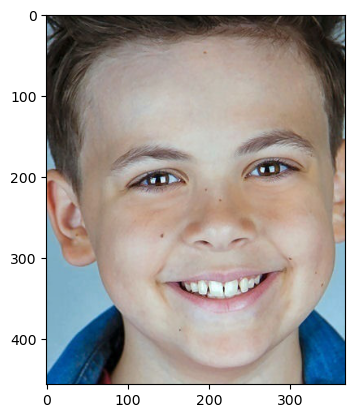

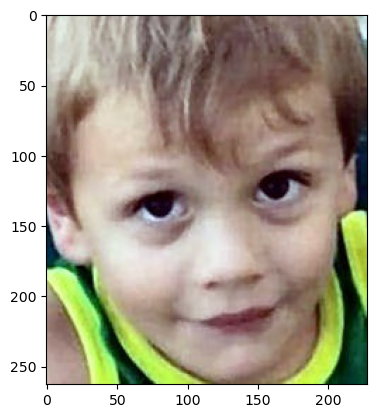

In [43]:
import matplotlib.image as mpimg
for ima in train_imgs[0:3]:
    img=mpimg.imread(ima)
    imgplot = plt.imshow(img)
    plt.show()

In [44]:
nrows = 150
ncolumns  = 150
channels = 3


def read_and_process_image(list_of_images):
    X = []
    y = []
    
    for image in list_of_images:
        X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (nrows, ncolumns), interpolation = cv2.INTER_CUBIC))
        if 'Non_Autistic' in image:
            y.append(0)
        else:
            y.append(1)
            
    return X,y

In [45]:
X_train, y_train = read_and_process_image(train_imgs)


In [46]:
sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
X_train = np.array(X_train)
y_train = np.array(y_train)

<Figure size 1200x800 with 0 Axes>

In [47]:
def process_data_tsne(list_of_images):
    nrows = 150
    ncolumns  = 150
    channels = 3
    
    X = []
    y = []
    
    for image in list_of_images:
        X.append(cv2.resize(cv2.imread(image, cv2.COLOR_BGR2GRAY), (nrows, ncolumns)))
        if 'Non_Autistic' in image:
            y.append(0)
        else:
            y.append(1)
            
    X = np.asarray(X)
    y = np.asarray(y)
    X = X.reshape(2540, 150*150*3)
    
    return X,y

In [48]:
features, labels = process_data_tsne(train_imgs)


In [49]:
tsne = TSNE(random_state=42).fit_transform(features)


In [50]:
def visualise_tsne_3d(tsne_data, target):
    colour_map = []
    for i in target:
        if i == 1:
            colour_map.append('r')
        else:
            colour_map.append('b')

    fig = plt.figure(figsize=(18, 18))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*zip(*tsne), c=colour_map, s=30, alpha=1)
    legenditems = [(plt.Rectangle((0,0),1,1, color=c), "Non_Autistic" if str(i) == '0' else "Autistic") for i,c in enumerate(np.unique(colour_map))]
    plt.legend(*zip(*legenditems))
    plt.show()

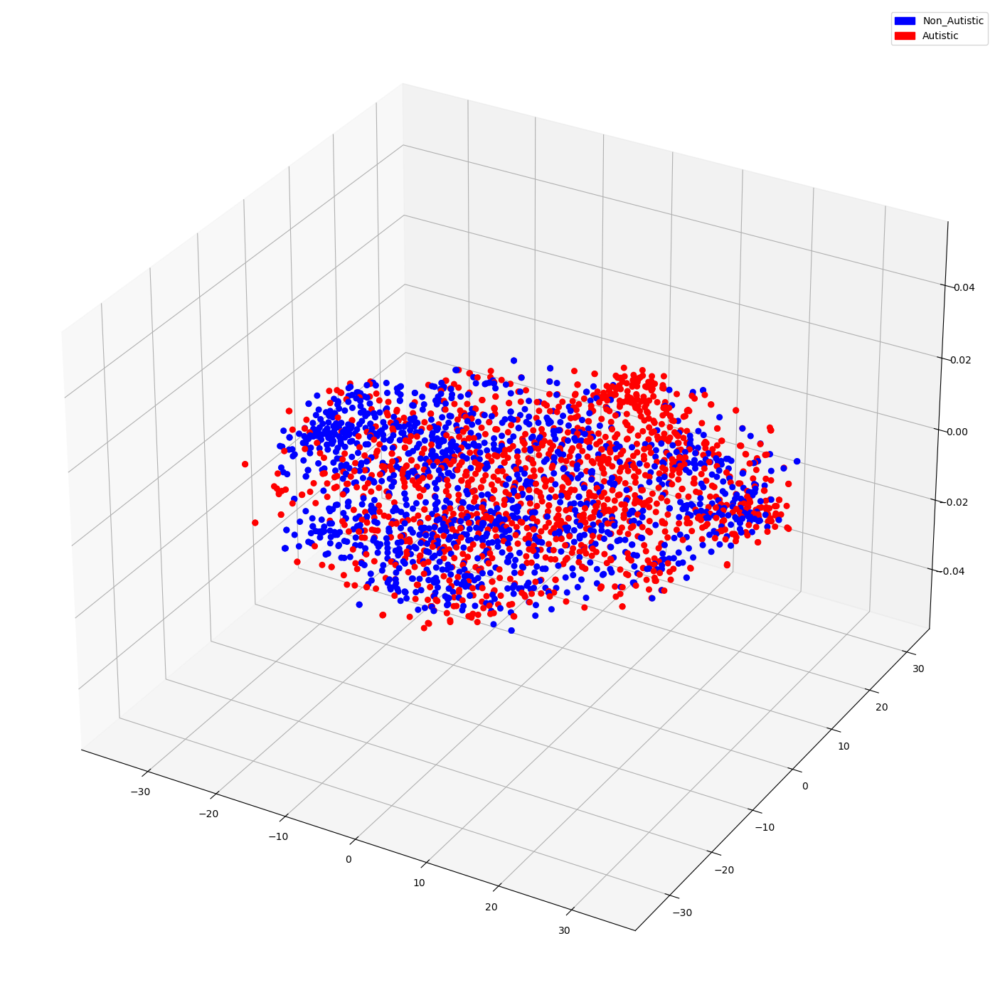

In [51]:
visualise_tsne_3d(tsne, labels)


In [52]:
def visualise_tsne_datapoints(tsne_data, labels):
    
    """Takes in tsne projections, plots distribution of datapoints in 2 classes"""
    
    tx = tsne_data[:,0]
    ty = tsne_data[:,1]
    plt.figure(figsize=(20,18))
    sns.scatterplot(
    x=tx, y=ty,
    hue=labels,
    palette=['blue', 'red'],
    s=300, 
    legend='auto'
    )

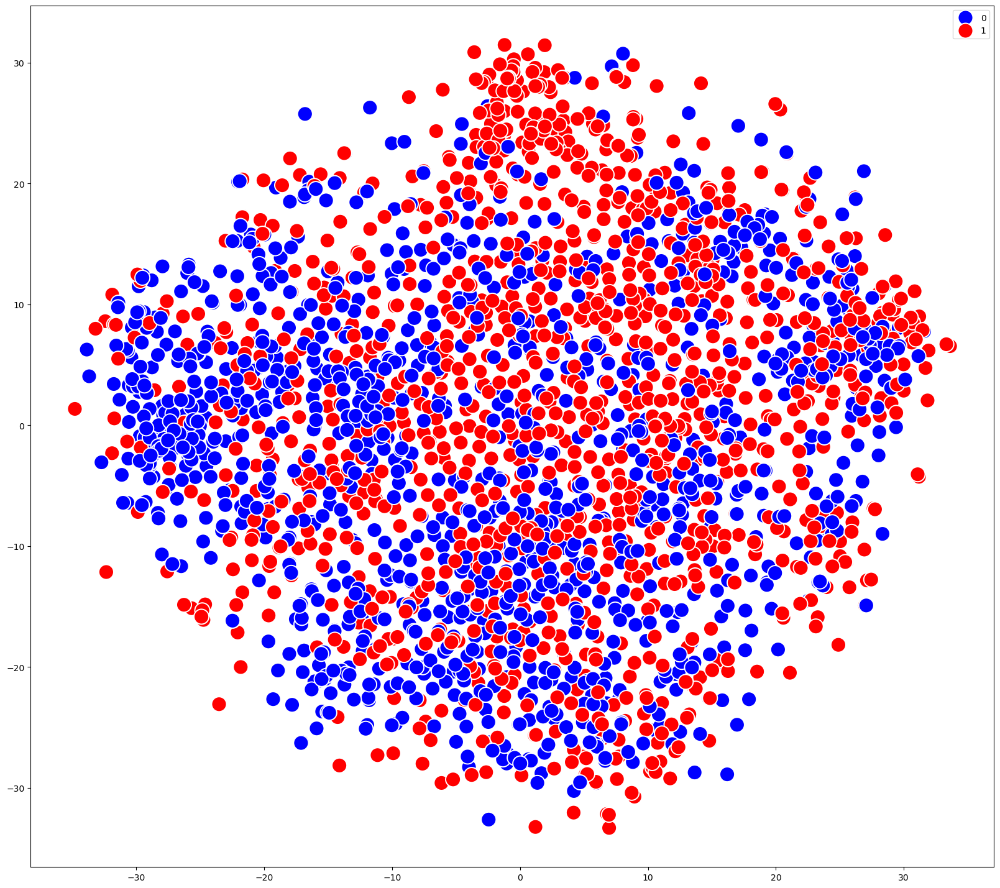

In [53]:
visualise_tsne_datapoints(tsne,labels)


In [54]:
import numpy as np
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def visualise_tsne_images(tsne_data, train_images, labels):
    tx = tsne_data[:, 0]
    ty = tsne_data[:, 1]
    image_paths = [train_images[i] for i in range(len(train_images))]

    tx = (tx - np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty - np.min(ty)) / (np.max(ty) - np.min(ty))

    width = 4000
    height = 3000
    max_dim = 200

    full_image = Image.new('RGBA', (width, height))
    for img, x, y, label in zip(image_paths, tx, ty, labels):
        tile = Image.open(img)
        rs = max(1, tile.width / max_dim, tile.height / max_dim)
        tile = tile.resize((int(tile.width / rs), int(tile.height / rs)), Image.Resampling.LANCZOS)
        tile_height, tile_width = tile.size
        draw = ImageDraw.Draw(tile)
        draw.rectangle((0, 0, tile_height-1, tile_width-1), fill=None, outline='blue' if label == 0 else 'red', width=8)
        full_image.paste(tile, (int((width - max_dim) * x), int((height - max_dim) * (1 - y))), mask=tile.convert('RGBA'))

    plt.figure(figsize=(30, 28))
    plt.imshow(full_image)
    plt.show()



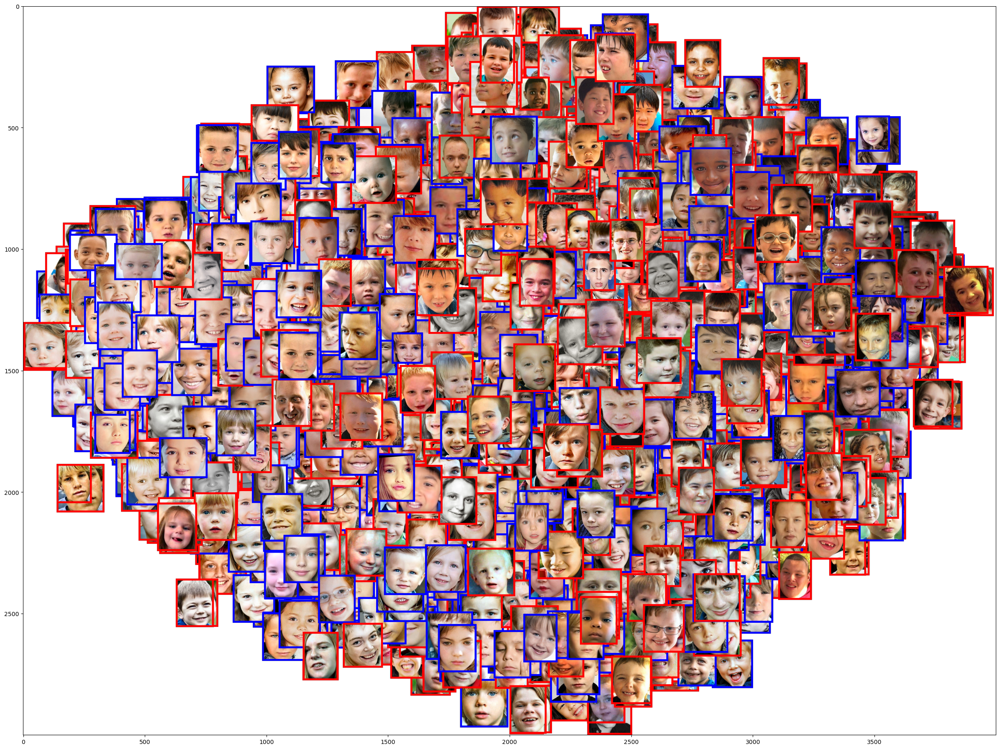

In [55]:
visualise_tsne_images(tsne, train_imgs, labels)


In [56]:
print("Shape of train images:", X_train.shape)
print("Shape of train labels:", y_train.shape)

Shape of train images: (2540, 150, 150, 3)
Shape of train labels: (2540,)


In [84]:
val_autistic_path =  r"C:\Users\yalal\Downloads\autisum spectrum\valid\Autistic"
val_non_autistic_path =  r"C:\Users\yalal\Downloads\autisum spectrum\valid\Non_Autistic"

val_autistic_imgs = [os.path.join(val_autistic_path, i) for i in os.listdir(val_autistic_path)]
val_non_autistic_imgs = [os.path.join(val_non_autistic_path, i) for i in os.listdir(val_non_autistic_path)]
val_imgs = val_autistic_imgs + val_non_autistic_imgs
random.shuffle(val_imgs)
del val_autistic_imgs
del val_non_autistic_imgs
gc.collect()
X_val, y_val = read_and_process_image(val_imgs)







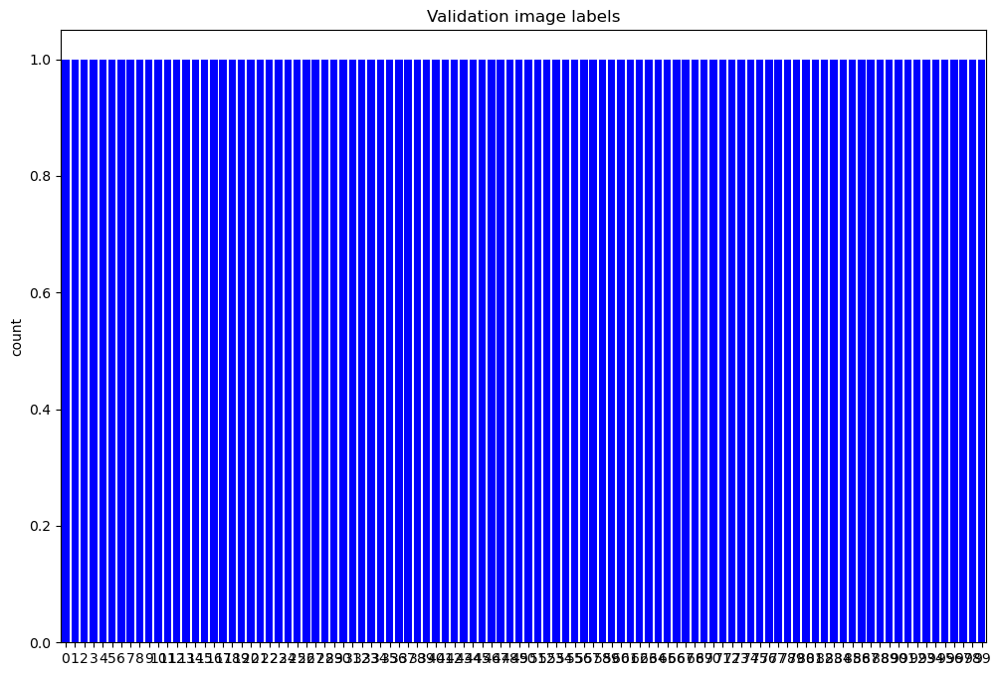

In [85]:

X_val = np.array(X_val)
y_val = np.array(y_val)

sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
sns.countplot(y_val, saturation=1)
plt.title("Validation image labels")
plt.show()


In [86]:
print("Shape of validation images:", X_val.shape)
print("Shape of validation labels:", y_val.shape)

Shape of validation images: (100, 150, 150, 3)
Shape of validation labels: (100,)


In [87]:
ntrain = len(X_train)
nval = len(X_val)
BATCH_SIZE = 32


In [88]:
base_model = VGG19(include_top=False, weights='imagenet', input_shape=(150, 150, 3))


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


In [89]:
for layer in base_model.layers:
    layer.trainable = False

In [90]:
# Let's see how many layers are in the vgg model
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  22


In [112]:
from tensorflow.keras.optimizers import Adam  # Correctly import the Adam optimizer

# Create our classifier model and connect pre-trained model (VGG19) to our model
model = keras.models.Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))  # Helps with regularization
model.add(layers.Dense(1, activation='sigmoid'))

# Compile the model with the correct optimizer and loss function
model.compile(optimizer=Adam(learning_rate=0.00001),  # Correct Adam optimizer usage
              loss='binary_crossentropy', 
              metrics=['accuracy'])


In [113]:
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 4, 4, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │       4,194,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,219,713 (92.39 MB)

 Trainable params: 4,195,329 (16.00 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [114]:
#model.compile(loss = 'binary_crossentropy', optimizer = keras.optimizers.Adam(), metrics = ['acc'])

In [115]:
# Change the learning rate in the Adam optimizer
#model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0001), metrics=['acc'])


In [116]:
model.compile(loss = 'binary_crossentropy', optimizer = keras.optimizers.Adam(), metrics = ['acc'])

In [117]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  rotation_range = 40,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)
                            

# Only rescaling for validation data
val_datagen = ImageDataGenerator(rescale = 1./255)

In [118]:
train_generator = train_datagen.flow(X_train, y_train, batch_size = BATCH_SIZE)
val_generator = val_datagen.flow(X_val, y_val, batch_size = BATCH_SIZE)

In [119]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=3)

# Train the model
history = model.fit(train_generator,
                              epochs=30,
                              validation_data=val_generator,
                              callbacks=[early_stopping]
                             )

Epoch 1/30


C:\Users\yalal\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


80/80 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - acc: 0.5899 - loss: 1.3239 - val_acc: 0.6600 - val_loss: 0.5726
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 157s 2s/step - acc: 0.7187 - loss: 0.5614 - val_acc: 0.7600 - val_loss: 0.5391
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - acc: 0.7083 - loss: 0.5790 - val_acc: 0.7200 - val_loss: 0.5375
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - acc: 0.7290 - loss: 0.5501 - val_acc: 0.7100 - val_loss: 0.5419
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - acc: 0.7102 - loss: 0.5354 - val_acc: 0.7200 - val_loss: 0.5296
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - acc: 0.7391 - loss: 0.5225 - val_acc: 0.7400 - val_loss: 0.5229
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - acc: 0.7221 - loss: 0.5331 - val_acc: 0.7700 - val_loss: 0.5224
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 157s 2s/step - acc: 0.7638 - loss: 0.5144 - val_acc: 0.6600 - val_loss: 0.5952
Epoch 9/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - acc: 0.7349 - loss: 0.

In [120]:
history_df = pd.DataFrame(history.history)
history_df

,acc,loss,val_acc,val_loss
0,0.632677,0.910173,0.66,0.572570
1,0.709055,0.577012,0.76,0.539091
2,0.718110,0.562374,0.72,0.537499
3,0.727165,0.546194,0.71,0.541903
4,0.714173,0.536889,0.72,0.529567
5,0.726772,0.539469,0.74,0.522862
6,0.728346,0.540088,0.77,0.522444
7,0.744488,0.527573,0.66,0.595164
8,0.729528,0.529294,0.74,0.514646
9,0.726772,0.511623,0.70,0.545433


Text(0.5, 1.0, 'Training and Validation Accuracy')

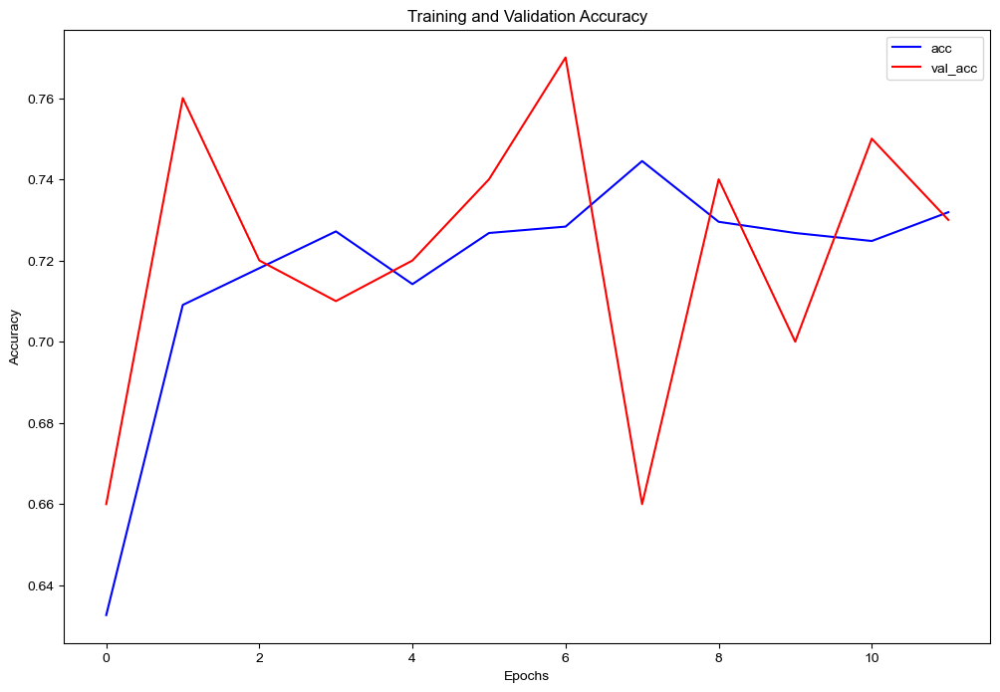

In [121]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=history_df.loc[:, ["acc", "val_acc"]], palette=['b', 'r'], dashes=False)
sns.set_style("whitegrid")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")

Text(0.5, 1.0, 'Training and Validation Loss')

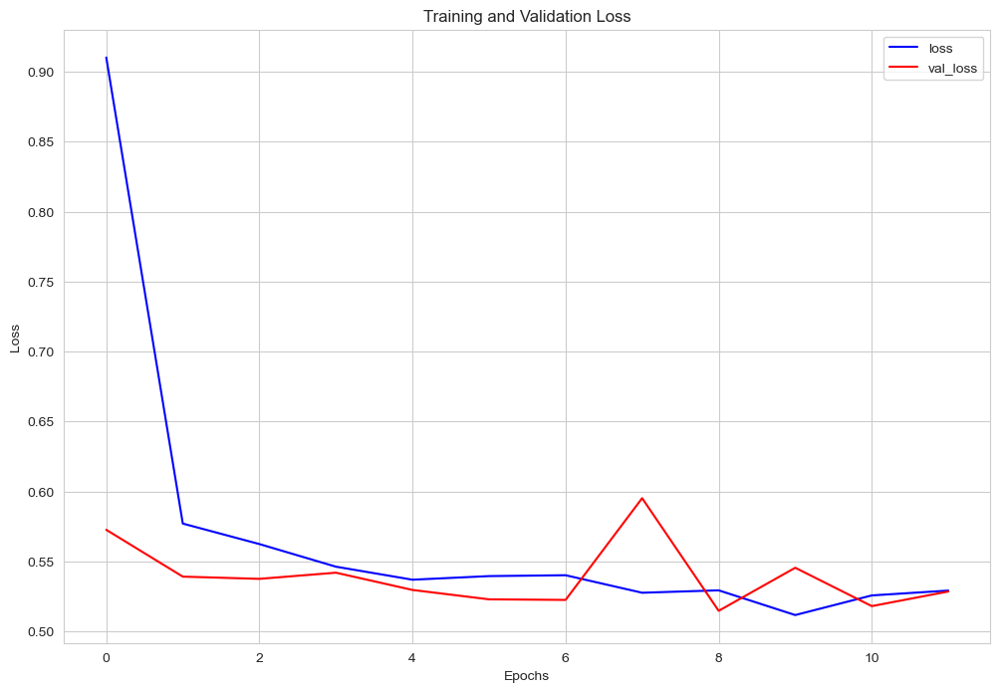

In [122]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=history_df.loc[:, ["loss", "val_loss"]], palette=['b', 'r'], dashes=False)
sns.set_style("whitegrid")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")

In [123]:
def get_features(trained_model, validation_data):
    
    def get_truncated_model(trained_model):
    
        """Takes in the model, Returns truncated model without classification layer"""
        
        model = keras.models.Sequential()
        model.add(base_model)
        model.add(layers.Flatten())
        model.add(layers.Dense(512, activation = 'relu'))
        
        for i, layer in enumerate(model.layers):
            layer.set_weights(trained_model.layers[i].get_weights())
            
        model.compile(optimizer = keras.optimizers.Adam(),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
        return model

    # Get truncated model
    truncated_model = get_truncated_model(model)
    
    # Use truncated model to predict features from the last hidden layer
    features = truncated_model.predict(validation_data)
        
    return features

In [124]:
features = get_features(model, val_generator)


4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step


In [125]:
tsne_model = TSNE(random_state=42, perplexity=4).fit_transform(features)


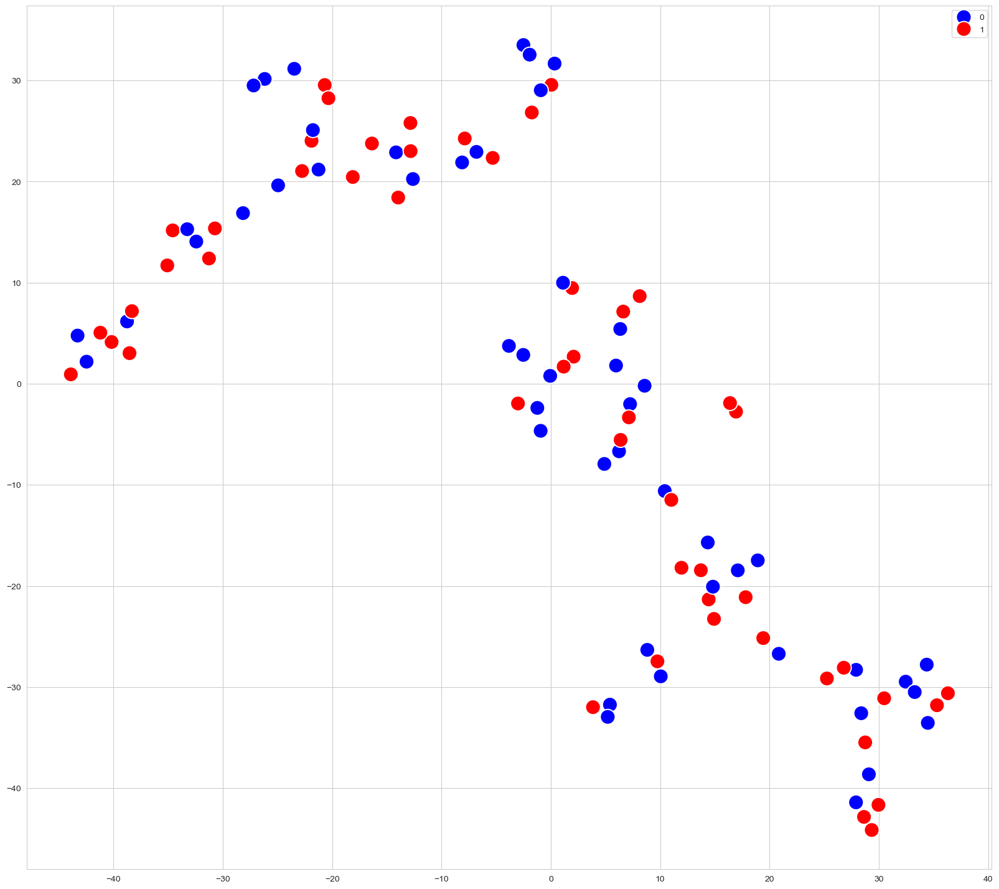

In [126]:
visualise_tsne_datapoints(tsne_model, y_val)


In [127]:
def visualise_model_tsne_3d(tsne_model, val_labels):
    colour_map = [] 
    for i in val_labels: 
        if i == 1: 
            colour_map.append('r') 
        else: 
            colour_map.append('b')

    fig = plt.figure(figsize=(18, 18))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*zip(*tsne_model), c=colour_map, s=50, alpha=1)
    legenditems = [(plt.Rectangle((0,0),1,1, color=c), "Non_Autistic" if str(i) == '0' else "Autistic") for i,c in enumerate(np.unique(colour_map))]
    plt.legend(*zip(*legenditems))
    plt.show()

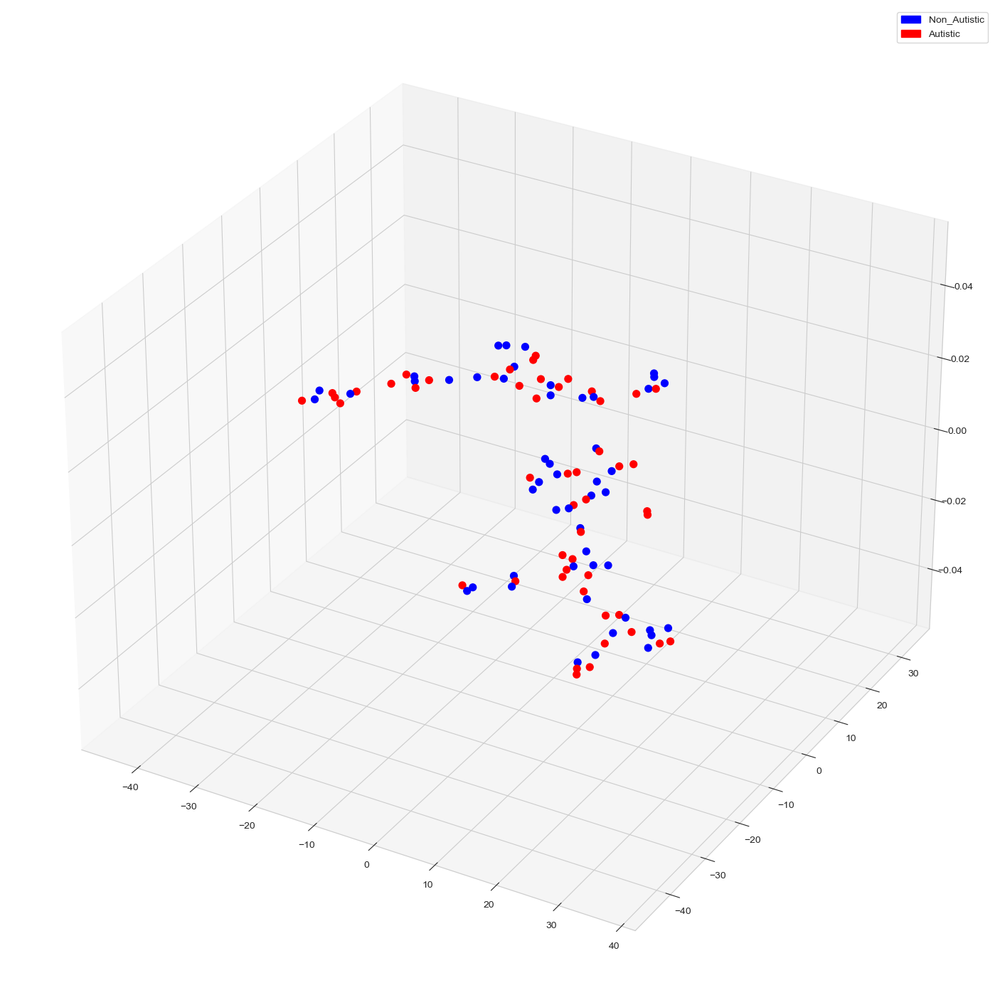

In [128]:
visualise_model_tsne_3d(tsne_model, y_val)


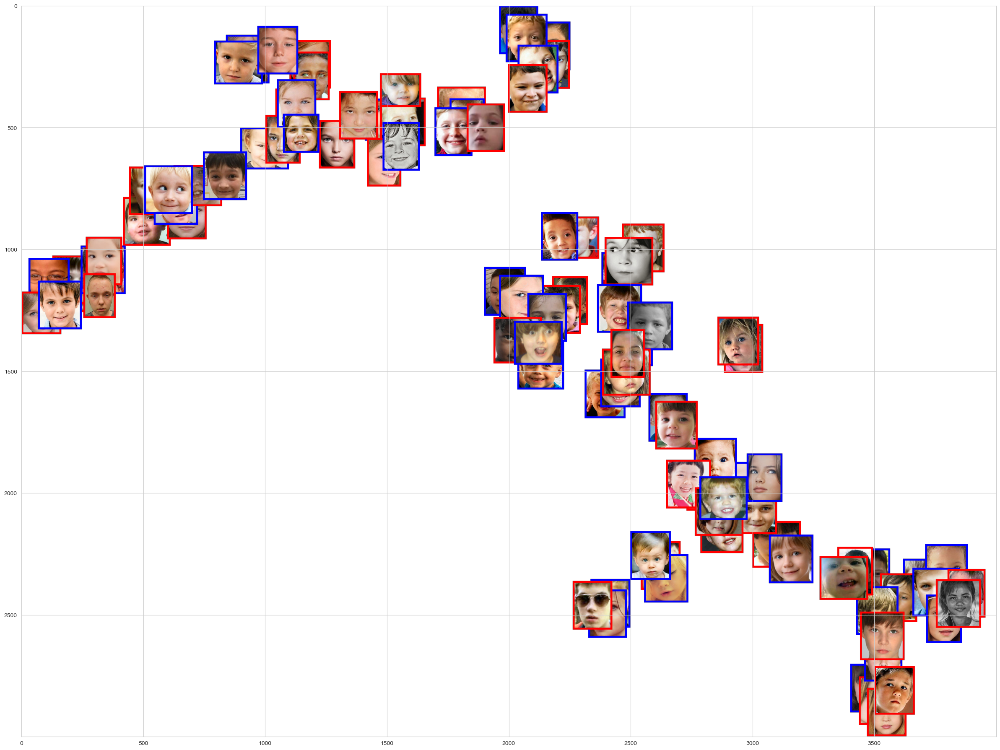

In [129]:
visualise_tsne_images(tsne_model, train_imgs, y_val)


In [130]:
random.shuffle(test_imgs)
X_test, y_test = read_and_process_image(test_imgs)
X = np.array(X_test)

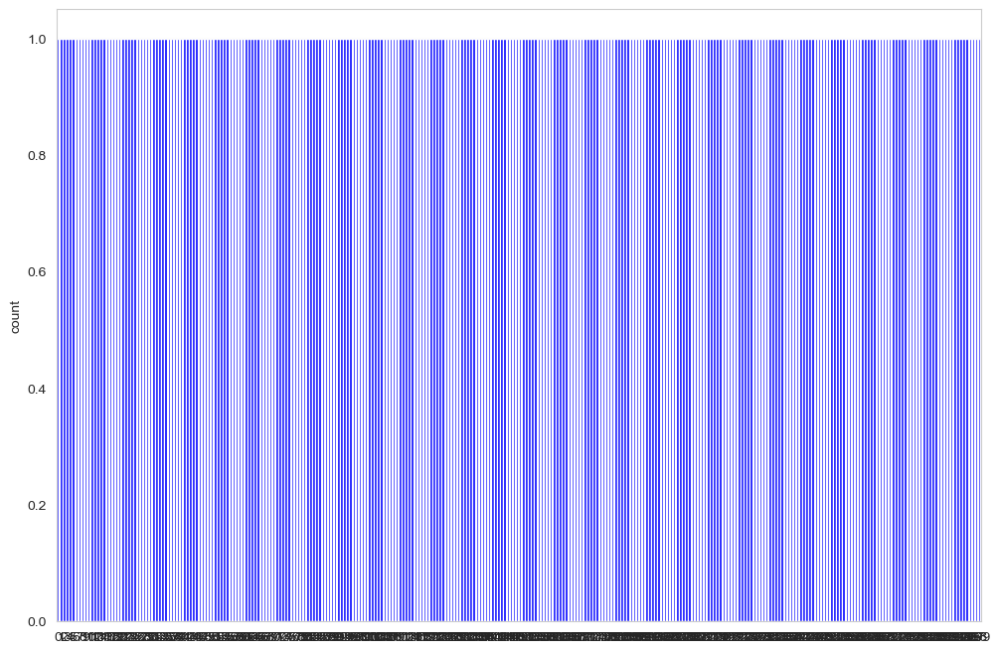

In [131]:
sns.set_palette(sns.color_palette(["b", "r"]))
plt.figure(figsize=(12, 8))
sns.countplot(y_test, saturation=1);

In [132]:
pred = model.predict(X)
threshold = 0.5
predictions = np.where(pred > threshold, 1,0)

10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step


In [133]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Autistic.100.jpg,1,1
1,Autistic.147.jpg,1,1
2,Autistic.115.jpg,1,0
3,Non_Autistic.137.jpg,0,0
4,Non_Autistic.13.jpg,0,0
...,...,...,...
295,Non_Autistic.15.jpg,0,1
296,Non_Autistic.9.jpg,0,0
297,Non_Autistic.106.jpg,0,0
298,Autistic.9.jpg,1,1


In [134]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Autistic.100.jpg,1,1
1,Autistic.147.jpg,1,1
2,Autistic.115.jpg,1,0
3,Non_Autistic.137.jpg,0,0
4,Non_Autistic.13.jpg,0,0
...,...,...,...
295,Non_Autistic.15.jpg,0,1
296,Non_Autistic.9.jpg,0,0
297,Non_Autistic.106.jpg,0,0
298,Autistic.9.jpg,1,1


In [135]:
test = pd.DataFrame(data = predictions, columns = ["predictions"])
test
test["filename"] = [os.path.basename(i) for i in test_imgs]
test["test_labels"] = y_test
test = test[["filename", "test_labels", "predictions"]]
test

,filename,test_labels,predictions
0,Autistic.100.jpg,1,1
1,Autistic.147.jpg,1,1
2,Autistic.115.jpg,1,0
3,Non_Autistic.137.jpg,0,0
4,Non_Autistic.13.jpg,0,0
...,...,...,...
295,Non_Autistic.15.jpg,0,1
296,Non_Autistic.9.jpg,0,0
297,Non_Autistic.106.jpg,0,0
298,Autistic.9.jpg,1,1


In [136]:
model_accuracy = accuracy_score(y_test, predictions)
print("Model Accuracy: {:.2f}%".format(model_accuracy * 100))

Model Accuracy: 68.67%


In [137]:
cl_report = classification_report(y_test, predictions)
print(cl_report)

              precision    recall  f1-score   support

           0       0.71      0.64      0.67       150
           1       0.67      0.73      0.70       150

    accuracy                           0.69       300
   macro avg       0.69      0.69      0.69       300
weighted avg       0.69      0.69      0.69       300



In [138]:
cn_matrix= confusion_matrix(y_test, predictions)
cn_matrix

array([[ 96,  54],
       [ 40, 110]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix')

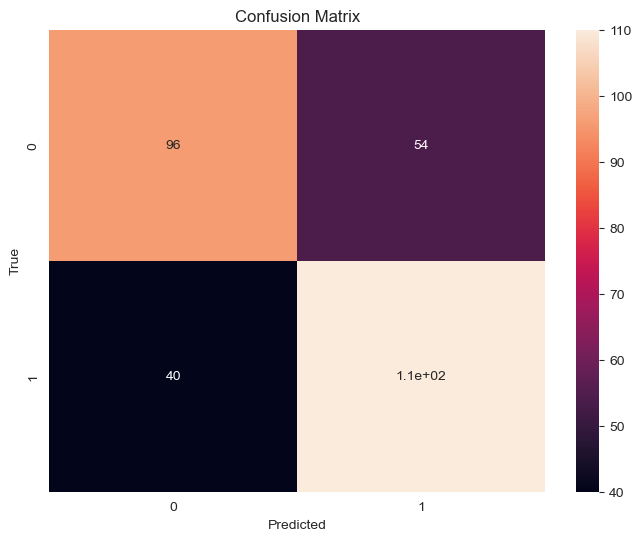

In [139]:
f, ax = plt.subplots(figsize = (8,6))
ax = sns.heatmap(cn_matrix, annot=True)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix")

In [140]:
fpr, tpr, _ = roc_curve(y_test, predictions)
roc_auc= auc(fpr, tpr)

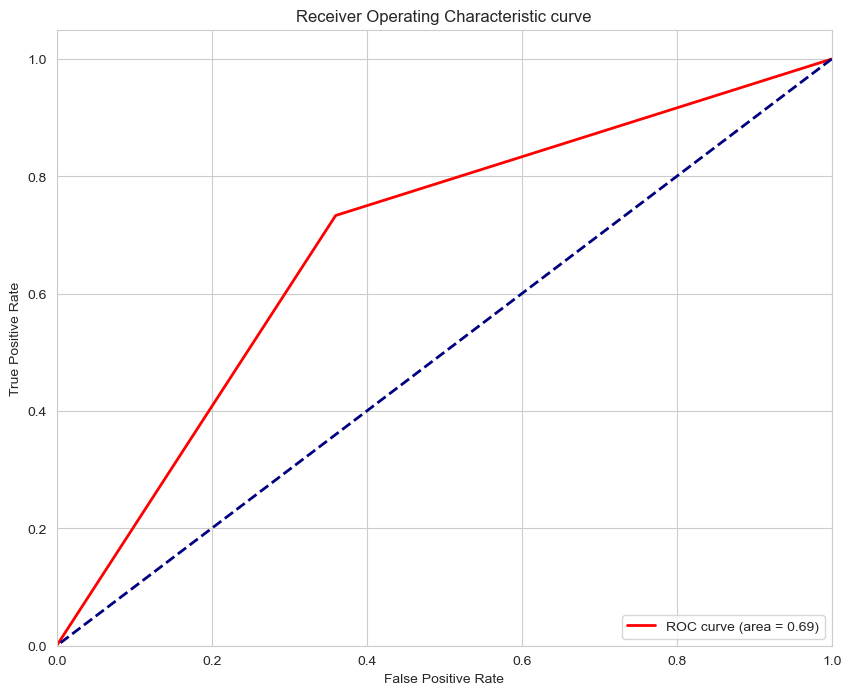

In [141]:
plt.figure(figsize = (10,8))
plt.plot(fpr, tpr, color = 'red', lw = 2, label = 'ROC curve (area = %0.2f)' % roc_auc)
plt.plot([1,0], [1,0], color = 'navy', lw = 2, linestyle = '--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Receiver Operating Characteristic curve")
plt.legend(loc = 'lower right')

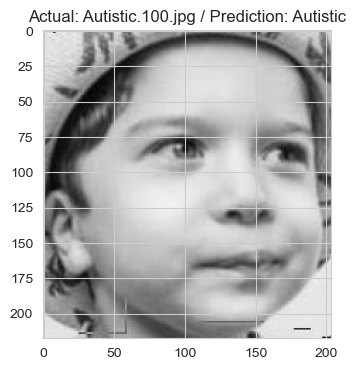

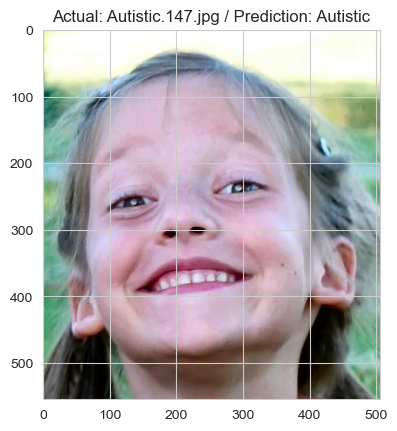

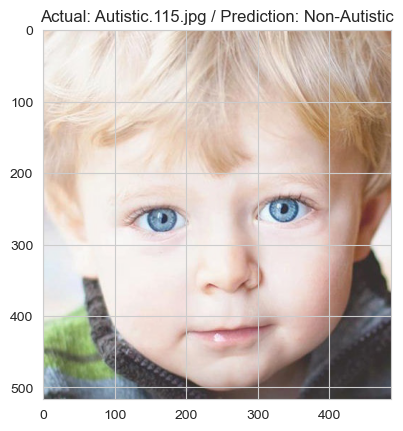

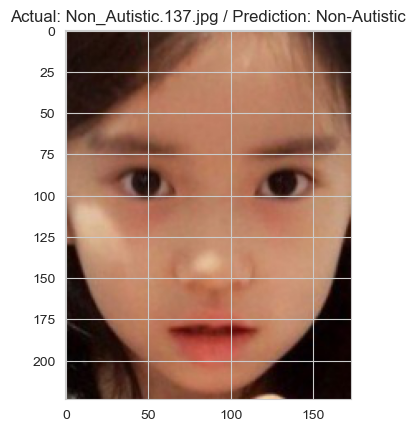

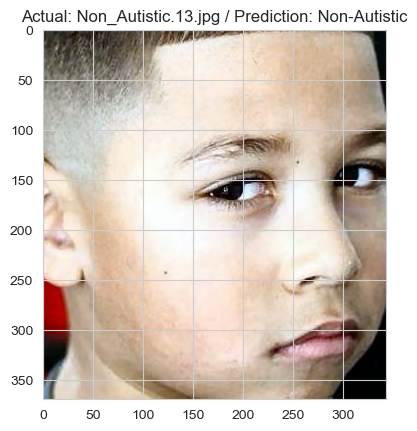

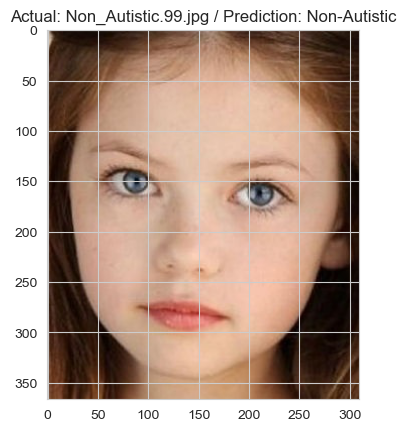

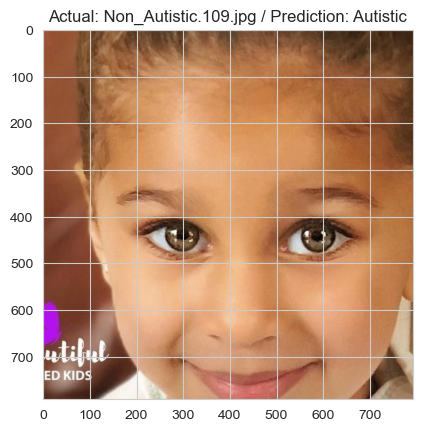

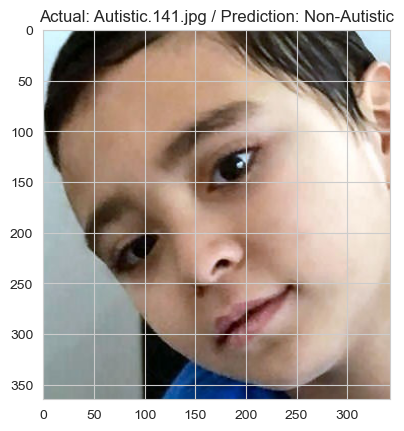

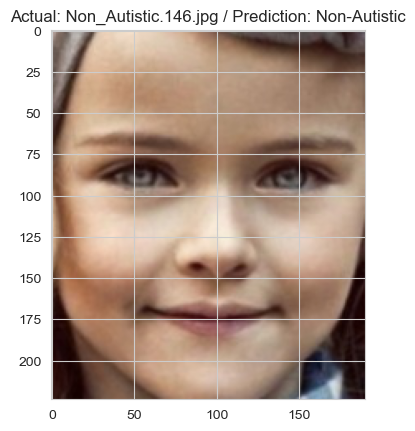

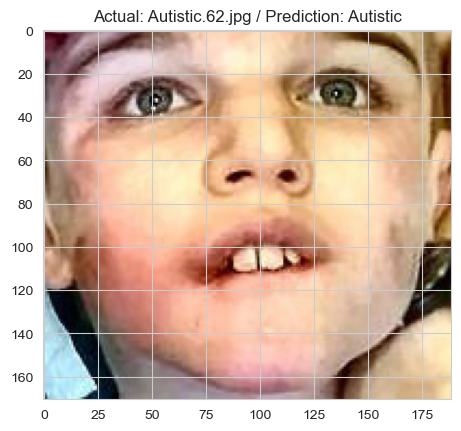

In [142]:
plt.figure(figsize=(4,4))
for val, i in enumerate(test_imgs[:10]):
    img = mpimg.imread(i)
    imgplot = plt.imshow(img)
    plt.title('Actual: ' + os.path.basename(i) + ' / Prediction: ' +  f"{'Autistic' if predictions[val] == 1 else 'Non-Autistic'}")
    plt.show()